# Relative path of the dataset

In [1]:
import os
folders = os.listdir('.\Traces_TimeXY_30sec_txt\\')
folders

['KAIST', 'NCSU', 'NewYork', 'Orlando', 'Statefair']

# Imports and constants

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
from pykalman import KalmanFilter
import pysindy as ps
from pysindy.differentiation import SmoothedFiniteDifference as SFD

HOW_MANY_DERIVATIVES = 10
SMOOTHER_WINDOW_LENGTH = 7

# Helping functions

In [3]:
def compute_derivatives(list_of_dataframes):
    sfd = SFD(smoother_kws={'window_length':SMOOTHER_WINDOW_LENGTH})
    for df in list_of_dataframes:
        for derivative in range(1, HOW_MANY_DERIVATIVES+1):
            order_label = derivative*'d'
            previous_order = (derivative-1)*'d'
            df[order_label+'x'] = sfd._differentiate(df[previous_order+'x'],df['time'].values)
            df[order_label+'y'] = sfd._differentiate(df[previous_order+'y'],df['time'].values)
        df.dropna(inplace=True)
    return

def find_fast(list_of_dfs):
    """Prints nothing if everything is in order"""
    for i,df in enumerate(list_of_dfs):
        df['speed'] = np.sqrt(df['dx']**2 + df['dy']**2)/30
        very_very_fast = df['speed'] > 10.44 # the speed of Usain Bolt # result: None
        very_fast = df['speed'] > 3     # double the average walking speed of a human 
        if very_very_fast.sum() != 0:
            print(f'{i} is faster than Usain Bolt!')
            print(df.loc[very_fast,['speed','time','x','y','dx','dy']])
        if very_fast.sum() != 0:
            print(f'{i} is very fast!')
            print(df.loc[very_fast,['speed','time','x','y','dx','dy']])
    return

def check_consistency_in_time_deltas(list_of_dfs):
    """prints nothing if all time deltas in list_of_dfs are not greater than 30"""
    for i,df in enumerate(list_of_dfs):
        time_delta = df['time'].diff().shift(-1) > 30
        time_delta.fillna(30, inplace=True)
        if (time_delta.sum() != 0):
            print(i)
            print(df.loc[time_delta,['speed','time','x','y','dx','dy']])
    return

def compute_kalman (list_of_dfs):
    kf = KalmanFilter(transition_matrices = [[1, 1], 
                                             [0, 1]], 
                      observation_matrices = [[0.1, 0.5], 
                                              [-0.3, 0.0]])
    filtered_dfs = []
    for df in list_of_dfs:
        positions = df[['x','y']]
        kf = kf.em(positions, n_iter=5)
        (filtered_state_means, filtered_state_covariances) = kf.filter(positions)
        (smoothed_state_means, smoothed_state_covariances) = kf.smooth(positions)
        kalman_df = pd.DataFrame(smoothed_state_means,columns=['x','y'])
        kalman_df['time'] = [(x+1)*30.0 for x in range(kalman_df.shape[0])]
        filtered_dfs.append(kalman_df)
    return filtered_dfs

def compute_and_plot_correlations(some_df, axis='x', plot=True):
    columns = [derivative*'d'+axis for derivative in range(HOW_MANY_DERIVATIVES)]
    previous_corr = None
    corr_matrix = some_df[columns].corr()
    if plot:
        plt.figure(figsize=(10,7))
        plt.matshow(corr_matrix,cmap='bwr')
        plt.xticks(range(len(columns)), columns, fontsize=14, rotation=45)
        plt.yticks(range(len(columns)), columns, fontsize=14)
        cb = plt.colorbar()
        cb.ax.tick_params(labelsize=14)
        plt.show()
    return corr_matrix

def compute_average_matrix(list_of_dfs,axis='x'):
    previous_matrix = None
    for i, df in enumerate(list_of_dfs):
        corr_matrix = compute_and_plot_correlations(df,axis=axis,plot=False)
        if i > 0:
            average_matrix = (corr_matrix + previous_matrix)/2
        previous_matrix = corr_matrix
    return average_matrix

# Plotting functions

In [17]:
def plot_trajectories(list_of_dfs,locations=False,list_locations=list()):
    for i,df in enumerate(list_of_dfs):
        x = df['x']
        y = df['y']
        fig, ax = plt.subplots()
        AB = ax.scatter(x, y, c = '#1f77b4', marker = 'o', s = 10, zorder = 3)
        ax.scatter(x[0],y[0],c='r',zorder=100)
        ax.quiver(x, y, x.diff().shift(-1),y.diff().shift(-1), angles='xy', 
              scale_units='xy', 
              scale=1,
              linewidth=50,
                 )
        plt.legend(['Position','Start','Displacement'])
        if locations:
            plt.title(list_locations[i]+' '+str(i))
        else:
            plt.title(f'Trajectory {i}')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.show()
    return

def plot_derivatives(some_df, axis='x', how_many_derivatives=HOW_MANY_DERIVATIVES):
    my_axes = []
    fig, my_axes = plt.subplots(how_many_derivatives+1, sharex=True, figsize=(10,7))
    fig.text(0.5, 0.04, 'time', ha='center')

    color = iter(cm.rainbow(np.linspace(0, 1, how_many_derivatives+1)))
    for derivative in range(0, how_many_derivatives+1):
        c = next(color)
        order_label = derivative*'d'
        my_axes[derivative].plot(some_df['time'],some_df[order_label+axis],c=c)
        my_axes[derivative].set_ylabel(order_label+axis)
    plt.show()
    return

# Begin analysis

In [5]:
my_dfs = list()
my_locations = list()
for current_folder in folders[:]:
    DIR = '.\Traces_TimeXY_30sec_txt\\'+current_folder+'\\'
    filelist = os.listdir(DIR)
    for file in filelist[:]:
        my_locations.append(current_folder)
        df = pd.read_csv(DIR+file, sep='\t',index_col=False,usecols=[0,1,2])
        df.columns = ['time','x','y']
        my_dfs.append(df)
print('Done')

Done


In [6]:
compute_derivatives(my_dfs)
print('Done')

Done


In [7]:
find_fast(my_dfs)
print('Done')

57 is very fast!
        speed     time            x            y          dx         dy
963  4.025719  28920.0 -3845.484438  2310.326963  107.779014 -54.492718
964  4.777006  28950.0  2424.766192  -837.780397  128.056511 -64.337696
965  3.679222  28980.0  8969.681611 -4136.731993   98.786662 -49.236165
Done


In [8]:
check_consistency_in_time_deltas(my_dfs)
print('Done')

Done


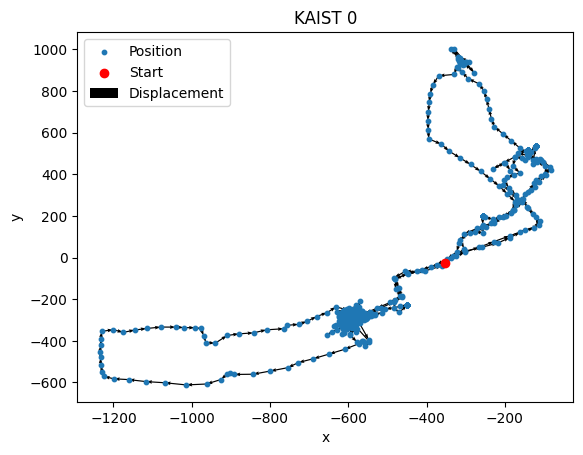

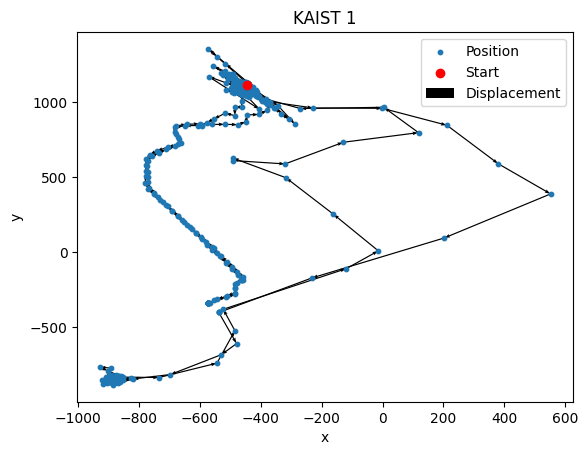

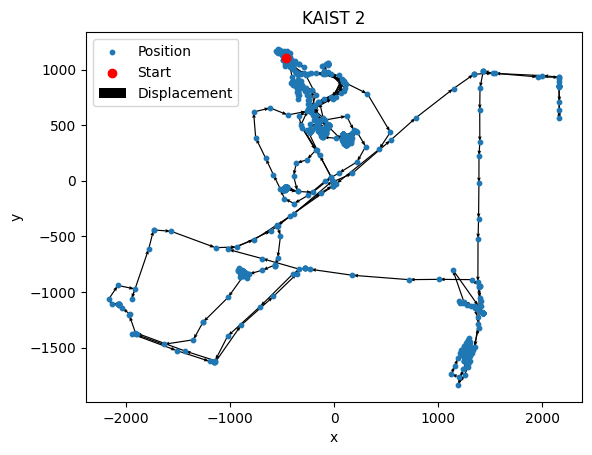

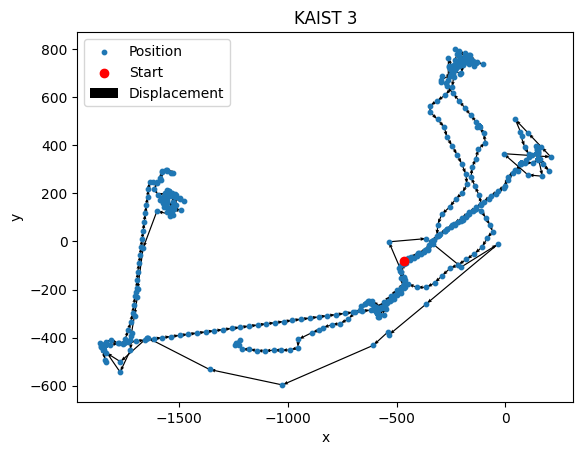

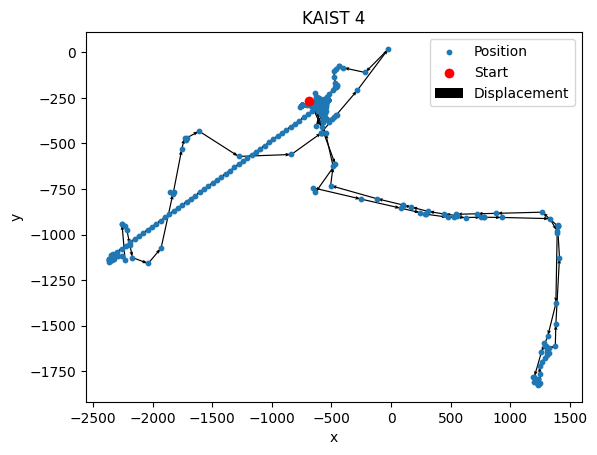

...

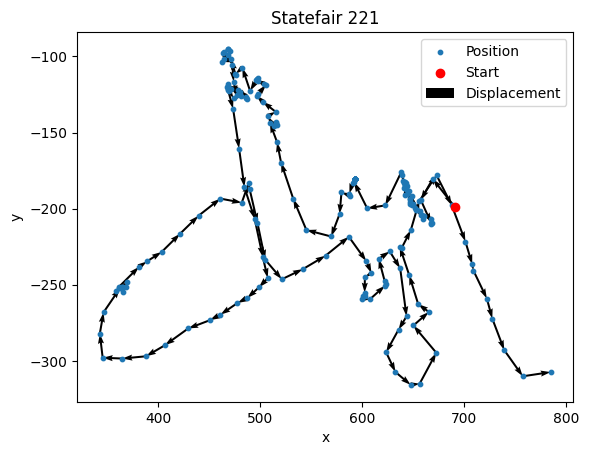

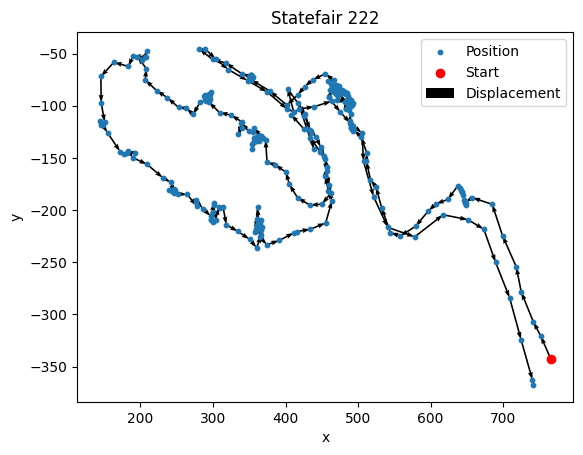

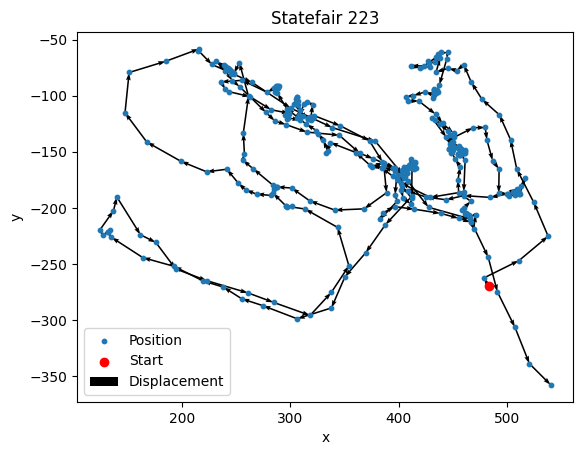

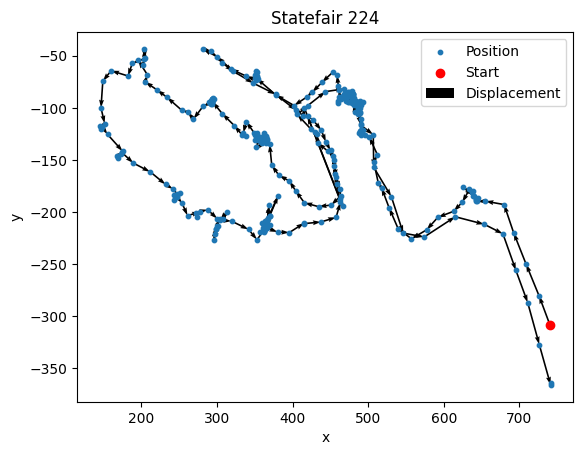

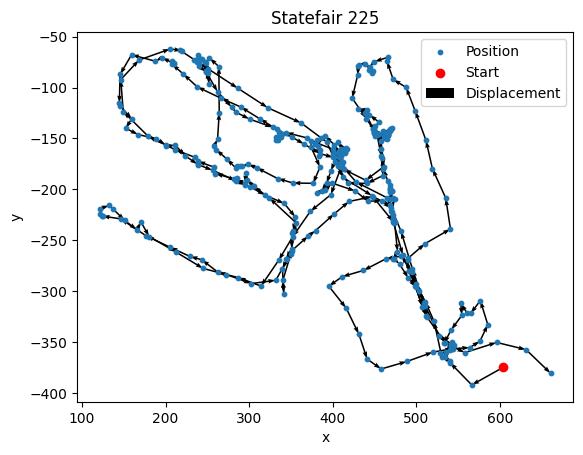

In [9]:
plot_trajectories(my_dfs,locations=True,list_locations=my_locations)

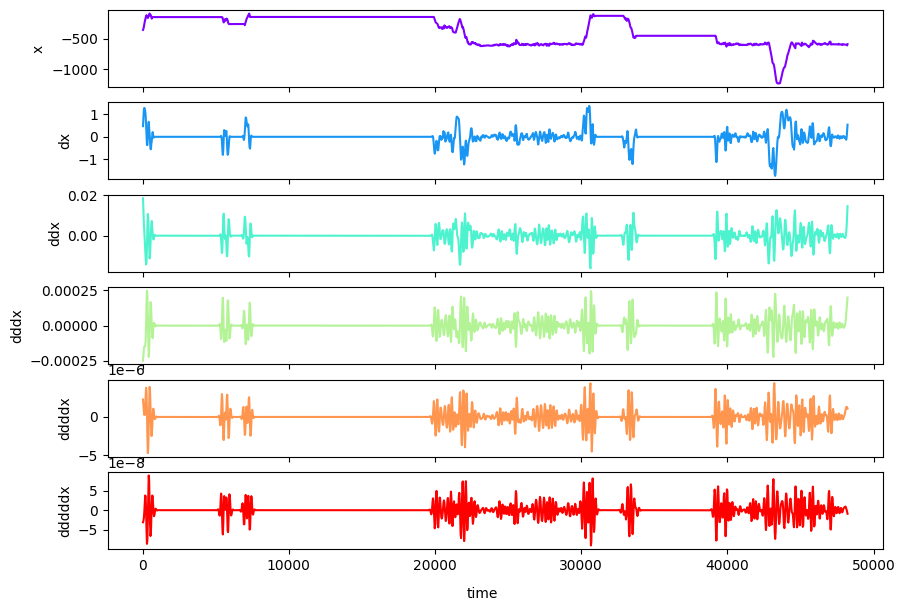

In [18]:
plot_derivatives(my_dfs[0], axis='x', how_many_derivatives=5)

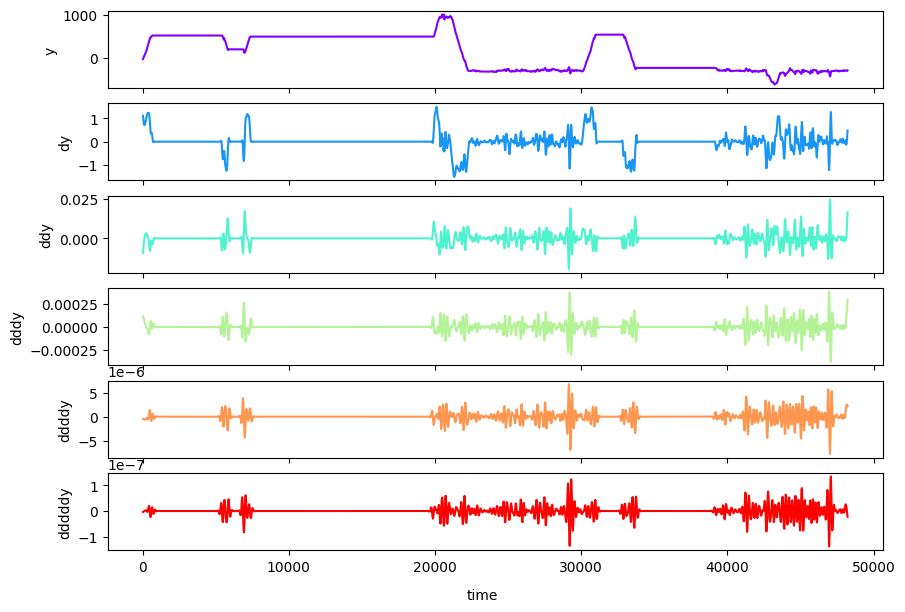

In [19]:
plot_derivatives(my_dfs[0], axis='y', how_many_derivatives=5)

<Figure size 1000x700 with 0 Axes>

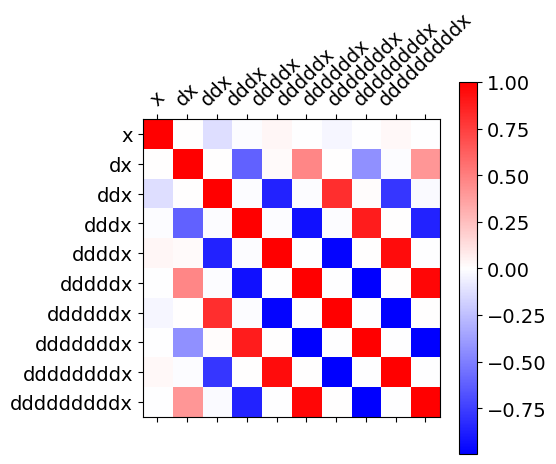

,x,dx,ddx,dddx,ddddx,dddddx,ddddddx,dddddddx,ddddddddx,dddddddddx
x,1.000000,0.007645,-0.122941,-0.007686,0.036691,-0.002626,-0.029186,0.000242,0.026671,0.000230
dx,0.007645,1.000000,0.008351,-0.605832,0.024623,0.472353,0.003191,-0.432248,-0.008069,0.407845
ddx,-0.122941,0.008351,1.000000,-0.012324,-0.858831,-0.008962,0.814529,0.014348,-0.777234,-0.013223
dddx,-0.007686,-0.605832,-0.012324,1.000000,-0.008224,-0.929693,-0.006413,0.889216,0.009662,-0.858508
ddddx,0.036691,0.024623,-0.858831,-0.008224,1.000000,-0.003895,-0.976982,0.004209,0.948794,-0.004920
dddddx,-0.002626,0.472353,-0.008962,-0.929693,-0.003895,1.000000,-0.000283,-0.989843,0.002864,0.972000
ddddddx,-0.029186,0.003191,0.814529,-0.006413,-0.976982,-0.000283,1.000000,-0.000830,-0.993018,0.002762
dddddddx,0.000242,-0.432248,0.014348,0.889216,0.004209,-0.989843,-0.000830,1.000000,-0.002127,-0.995107
ddddddddx,0.026671,-0.008069,-0.777234,0.009662,0.948794,0.002864,-0.993018,-0.002127,1.000000,-0.000020
dddddddddx,0.000230,0.407845,-0.013223,-0.858508,-0.004920,0.972000,0.002762,-0.995107,-0.000020,1.000000


In [12]:
compute_and_plot_correlations(my_dfs[0])

<Figure size 1000x700 with 0 Axes>

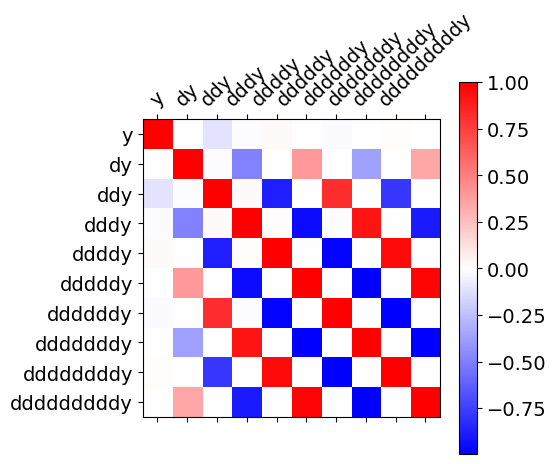

,y,dy,ddy,dddy,ddddy,dddddy,ddddddy,dddddddy,ddddddddy,dddddddddy
y,1.000000,0.009321,-0.102255,-0.008986,0.017712,-0.001630,-0.016764,0.001273,0.015732,-0.000906
dy,0.009321,1.000000,-0.009389,-0.483684,-0.003712,0.404685,-0.000911,-0.368812,0.001321,0.348154
ddy,-0.102255,-0.009389,1.000000,0.018885,-0.872389,-0.003068,0.819880,0.000302,-0.784807,0.000968
dddy,-0.008986,-0.483684,0.018885,1.000000,0.015563,-0.952466,-0.009218,0.915655,0.006029,-0.887873
ddddy,0.017712,-0.003712,-0.872389,0.015563,1.000000,0.001144,-0.983456,-0.002696,0.960832,0.002699
dddddy,-0.001630,0.404685,-0.003068,-0.952466,0.001144,1.000000,0.001010,-0.991516,-0.001385,0.976700
ddddddy,-0.016764,-0.000911,0.819880,-0.009218,-0.983456,0.001010,1.000000,0.000637,-0.994323,-0.001092
dddddddy,0.001273,-0.368812,0.000302,0.915655,-0.002696,-0.991516,0.000637,1.000000,0.000110,-0.995989
ddddddddy,0.015732,0.001321,-0.784807,0.006029,0.960832,-0.001385,-0.994323,0.000110,1.000000,0.000365
dddddddddy,-0.000906,0.348154,0.000968,-0.887873,0.002699,0.976700,-0.001092,-0.995989,0.000365,1.000000


In [13]:
compute_and_plot_correlations(my_dfs[0],axis='y')

<Figure size 1000x700 with 0 Axes>

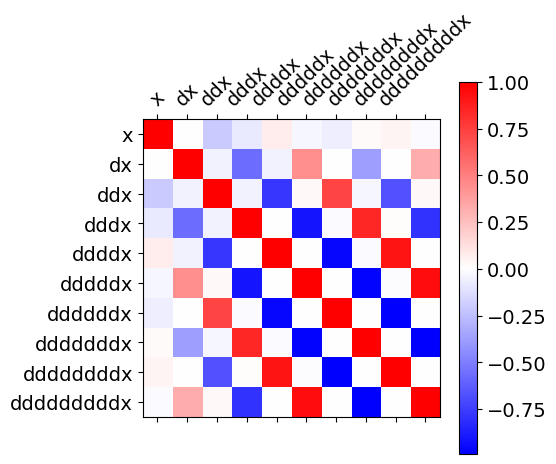

<Figure size 1000x700 with 0 Axes>

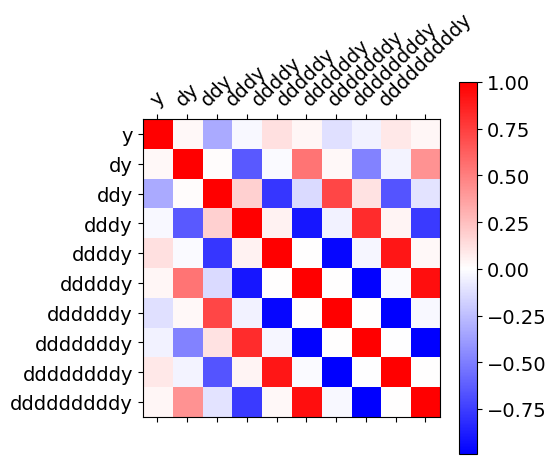

In [14]:
average_matrix_x = compute_average_matrix(my_dfs[:],axis='x')
average_matrix_y = compute_average_matrix(my_dfs[:],axis='y')

plt.figure(figsize=(10,7))
plt.matshow(average_matrix_x,cmap='bwr')
plt.xticks(range(len(average_matrix_x.columns)), average_matrix_x.columns, fontsize=14, rotation=45)
plt.yticks(range(len(average_matrix_x.columns)), average_matrix_x.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.show()
plt.figure(figsize=(10,7))
plt.matshow(average_matrix_y,cmap='bwr')
plt.xticks(range(len(average_matrix_y.columns)), average_matrix_y.columns, fontsize=14, rotation=45)
plt.yticks(range(len(average_matrix_y.columns)), average_matrix_y.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.show()

In [15]:
filtered_dfs = compute_kalman(my_dfs[:])
compute_derivatives(filtered_dfs)

<Figure size 1000x700 with 0 Axes>

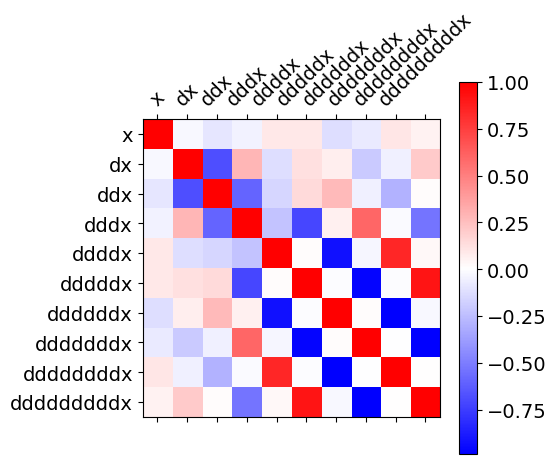

<Figure size 1000x700 with 0 Axes>

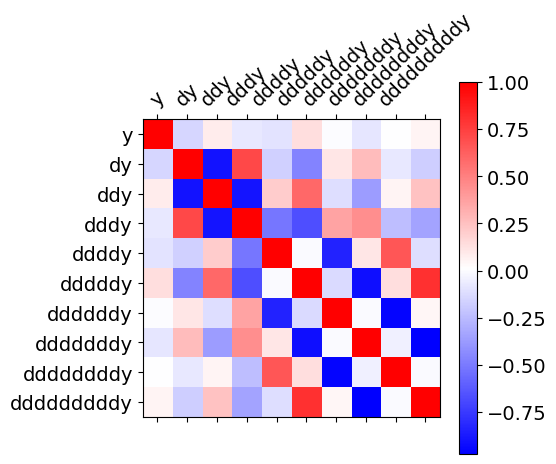

In [16]:
average_matrix_x = compute_average_matrix(filtered_dfs,axis='x')
average_matrix_y = compute_average_matrix(filtered_dfs,axis='y')

plt.figure(figsize=(10,7))
plt.matshow(average_matrix_x,cmap='bwr')
plt.xticks(range(len(average_matrix_x.columns)), average_matrix_x.columns, fontsize=14, rotation=45)
plt.yticks(range(len(average_matrix_x.columns)), average_matrix_x.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.show()
plt.figure(figsize=(10,7))
plt.matshow(average_matrix_y,cmap='bwr')
plt.xticks(range(len(average_matrix_y.columns)), average_matrix_y.columns, fontsize=14, rotation=45)
plt.yticks(range(len(average_matrix_y.columns)), average_matrix_y.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.show()